---

### 🎓 **Professor**: Apostolos Filippas

### 📝 **Student**: Leonard Chiang

### 📘 **Class**: AI Engineering

### 📋 **Homework 2**: Working with LLMs via API

### 📅 **Due Date**: Day of Lecture 3, 11:59 PM

#### 🔗 **My Repository**: https://github.com/lchiangnyc/ai-engineering-fordham

*(Replace the URL above with your actual repository URL)*

**Note**: You are not allowed to share the contents of this notebook with anyone outside this class without written permission by the professor.

---

## Project: Movie Poster Generator

In this homework, you'll build a mini-application that:
1. **Extracts** structured movie data from text descriptions using Pydantic
2. **Processes** multiple movies concurrently using async programming
3. **Explores** temperature, logprobs, and reasoning models
4. **Generates** movie posters using AI image generation

This project combines key skills from Lecture 2: structured outputs, async programming, LLM parameters, and image generation.

**Total Points: 145** (+ 10 bonus)

---

### A Note on Using Resources

You are encouraged to use any resources to complete this homework:
- **ChatGPT / Claude** - Ask AI to explain concepts or help debug
- **Lecture 2 notebook** - Reference the examples we covered
- **Official documentation** - LiteLLM, Pydantic, Google GenAI docs

When you use external resources, please cite them!

---

## Task 1: Environment Setup (10 points)

First, let's verify your environment is set up correctly.

### 1a. Verify imports work (5 pts)

Run the cell below. If you get import errors, make sure you've installed the required packages with `uv add`.

In [1]:
# Task 1a: Verify imports work (5 pts)
import litellm
from pydantic import BaseModel, Field
from typing import Literal
from google import genai
from google.genai import types
import asyncio
import time
import os
from dotenv import load_dotenv

# Load environment variables
load_dotenv()

print("All imports successful!")

All imports successful!


_I consulted Cursor's built-in AI assistant to get the virtual environment set up correctly.<br><br> The transcript of my exchange is saved in this directory as_ `cursor-chat_hw-2.md`_._

In [2]:
# Fielding additional code suggested by from Cursor agent
import sys
print(sys.version)
print(sys.executable)

3.14.2 (main, Jan 13 2026, 17:36:00) [MSC v.1944 64 bit (AMD64)]
c:\Users\leona\ai-engineering-fordham\.venv\Scripts\python.exe


In [3]:
# Importing more packages with bearing on later Tasks
import math
from IPython.display import Image, display

import matplotlib.pyplot as plt
import pandas as pd

_Code included hereafter naturally draws extensively on the Lecture 2 notebook._

### 1b. Verify API keys are set (5 pts)

Test that your API keys work by making a simple call.

In [4]:
# Using Prof. Daniel Groner's method for confirming API key read-in from .env
    # Attributing code I modified
        # Source - https://stackoverflow.com/a/4907053
            # Posted by Rod, modified by community. See post 'Timeline' for change history
            # Retrieved 2026-01-27, License - CC BY-SA 4.0

os.environ.get("OPENAI_API_KEY")
print(f"Length of OpenAI API key: {len(os.environ["OPENAI_API_KEY"])} characters")

Length of OpenAI API key: 164 characters


In [5]:
# Task 1b: Verify API keys (5 pts)
# Make a simple test call to verify your OpenAI API key works

response_1b = litellm.completion(
    model="gpt-5-mini",
    messages=[{"role": "user", "content": "Say 'API working!' and nothing else."}],
    max_tokens=20
    )
print(response_1b.choices[0].message.content)

_In my development efforts, the output of the Cell above has come back blank more than once. It's not displaying an error about the key being inaccessible/unusable, and my OpenAI Usage dashboard shows token consumption, so those aren't the issues._ 

In [ ]:
# Extracting from response_1b to isolate the cause
print(f"Extracts from response_1b:"
      f"\n  Reason for finish: {response_1b.choices[0].finish_reason}",
      f"\n\nLaying out response.choices:")
for item in response_1b.usage:
    print(f"  {item}")
print(f"\n    >> Tokens spent on reasoning: {response_1b.usage["completion_tokens_details"].reasoning_tokens}")

Extracts from response_1b:
  Reason for finish: length 

Laying out response.choices:
  ('completion_tokens', 20)
  ('prompt_tokens', 15)
  ('total_tokens', 35)
  ('completion_tokens_details', CompletionTokensDetailsWrapper(accepted_prediction_tokens=0, audio_tokens=0, reasoning_tokens=20, rejected_prediction_tokens=0, text_tokens=None, image_tokens=None))
  ('prompt_tokens_details', PromptTokensDetailsWrapper(audio_tokens=0, cached_tokens=0, text_tokens=None, image_tokens=None))

    >> Tokens spent on reasoning: 20


_As Cursor's assistant pointed out to me, the allocated tokens are all expended on reasoning, leaving none for formulating a response to return. To troubleshoot this, the assistant suggests increasing_ `max_tokens`_to 200 (tenfold!), and perhaps to use a non-reasoning model, e.g. GPT-4.1-mini, instead. With that in mind, then,_

In [7]:
# Modifying call characteristics
response_1b_41m = litellm.completion(     #41m for 4.1-mini
    model = "gpt-4.1-mini",
    messages = [
        {
            "role": "user",
            "content": "Say 'API working!' and nothing else."
            }
        ],
        max_tokens = 35
    )
print(response_1b_41m.choices[0].message.content)

API working!


In [8]:
print(f"Extracts from 4.1-mini response:"
      f"\n  Reason for finish: {response_1b_41m.choices[0].finish_reason}",
      f"\n\nLaying out response.choices:")
for item in response_1b_41m.usage:
    print(f"  {item}")
print(f"\n    >> Tokens spent on reasoning: {response_1b_41m.usage["completion_tokens_details"].reasoning_tokens}")

Extracts from 4.1-mini response:
  Reason for finish: stop 

Laying out response.choices:
  ('completion_tokens', 3)
  ('prompt_tokens', 16)
  ('total_tokens', 19)
  ('completion_tokens_details', CompletionTokensDetailsWrapper(accepted_prediction_tokens=0, audio_tokens=0, reasoning_tokens=0, rejected_prediction_tokens=0, text_tokens=None, image_tokens=None))
  ('prompt_tokens_details', PromptTokensDetailsWrapper(audio_tokens=0, cached_tokens=0, text_tokens=None, image_tokens=None))

    >> Tokens spent on reasoning: 0


_No reasoning tokens expended anymore, and apparently I would have been fine without upping_ `max_tokens` _after all (19, the number of_ `total_tokens` _for_ `response_41m` _, is less than 20)._

---

## Task 2: Design the Movie Schema (15 points)

Design a Pydantic model to represent movie data. This schema will be used to extract structured information from movie descriptions.

**Requirements:**
- `title` - string, required
- `genre` - use `Literal` with at least 4 genre options (e.g., "sci-fi", "drama", "action", "comedy", etc.)
- `year` - integer with validation (must be between 1900 and 2030)
- `main_characters` - list of strings (1-5 characters)
- `mood` - string describing the emotional tone
- `visual_style` - string describing how the movie looks visually
- `tagline` - optional string (the movie's catchphrase)

**Hints:**
- Use `Field(ge=..., le=...)` for numeric validation
- Use `Field(min_length=..., max_length=...)` for list length validation
- Use `| None = None` for optional fields

In [9]:
# Task 2: Design your Movie schema (15 pts)

class Movie(BaseModel):
    """Structured representation of a movie."""
    # YOUR CODE HERE - design the schema based on the requirements above
    title: str = Field(
        description = "Title")
    genre: Literal["sci-fi", "drama", "action", "comedy", "documentary", "romance", "horror"] = Field(
        description = "Type/classification")
    year: int = Field(
        description  = "Release date",
        ge = 1900, le = 2030)     # Must be between 1900 and 2030
    main_characters: list[str] = Field(
        description = "Main figures in plot events",
        min_length = 1, max_length = 5)     # At least one but no more than five characters
    mood: str = Field(
        description = "Emotional tone")
    visual_style: str = Field(
        description = "Cinematographic look/style")
    tagline: str | None = Field(
        # Providing default argument for optional schematic element
        default = None, 
        description = "Catchphrase (OPTIONAL)")

    pass

In [10]:
# Test your schema by creating a Movie object
# This should work if your schema is correct

test_movie = Movie(
    title = "The Matrix",
    # YOUR CODE HERE - fill in the rest of the fields
        # Manually populating after consulting https://en.wikipedia.org/wiki/The_Matrix
    genre = "sci-fi",
    year = 1999,
    main_characters = ["Neo", "Morpheus", "Trinity", "Agent Smith", "The Oracle"],
    mood = "dystopian",
    visual_style = "bullet time!"
    # Deliberately omitting tagline
)

print(test_movie.model_dump_json(indent=2))

{
  "title": "The Matrix",
  "genre": "sci-fi",
  "year": 1999,
  "main_characters": [
    "Neo",
    "Morpheus",
    "Trinity",
    "Agent Smith",
    "The Oracle"
  ],
  "mood": "dystopian",
  "visual_style": "bullet time!",
  "tagline": null
}


_I feel compelled to mention that the film is described [on Wikipedia](https://en.wikipedia.org/wiki/The_Matrix) as "science fiction action"– an example of how a given movie may fall in multiple genres– but the design specification stipulates_ `Literal` _, which does not permit multiple values, from what I can understand of_ [`Pydantic` _documentation_](https://docs.pydantic.dev/2.12/errors/validation_errors/#literal_error) _("<u>one</u> [emphasis added] of the expected literal values") and_ [_that of_ `typing`](https://typing.python.org/en/latest/spec/literal.html) _("<u>a</u> [emphasis added] specific and concrete value")._

---

## Task 3: Extract Movie Data with Structured Outputs (20 points)

Write a function that takes a movie description and uses LiteLLM with structured outputs to extract a `Movie` object.

**Hints:**
- Use `litellm.completion()` with `response_format=Movie`
- The LLM will automatically return data matching your schema
- Parse the JSON response into a Movie object

In [11]:
# Task 3: Write a function to extract movie data (20 pts)

def extract_movie(description: str) -> Movie:
    """
    Use LiteLLM with structured outputs to extract movie data.
    
    Args:
        description: A text description of a movie
        
    Returns:
        A Movie object with the extracted data
    """
    # YOUR CODE HERE
    # Using LiteLLM with response_format
    response = litellm.completion(
        model="gpt-5-mini",
        messages=[
            {
                "role": "system",
                "content": "Extract structured information from movie description."
                },
            {
                "role": "user",
                "content": f"Extract information from this description:\n\n{description}"
                }
            ],
        response_format = Movie  # Tell the LLM to return this structure!
        )

    print(f"Model call finished",
          f"\n  >> Finish reason: {response.choices[0].finish_reason}",
          f"\n  >> Total tokens expended: {response.usage.total_tokens}")

    # Parse the JSON response into our Pydantic model
    movie_data = Movie.model_validate_json(response.choices[0].message.content)

    return movie_data
    # pass

In [12]:
# Test your function with this description (Avatar)

test_description = """
The year is 2154. Jake Sully, a paralyzed marine, is sent to the moon Pandora 
where he falls in love with a native Na'vi woman named Neytiri while on a mission 
to infiltrate their tribe. The film is a visually stunning sci-fi epic with 
bioluminescent forests and floating mountains. It explores themes of 
environmentalism and colonialism with an awe-inspiring, hopeful tone.
"""

movie = extract_movie(test_description)
# Confirming function output is a Movie object
print(f"Object movie (type {type(movie)}):",
      f"\n{movie.model_dump_json(indent = 2)}")

Model call finished 
  >> Finish reason: stop 
  >> Total tokens expended: 852
Object movie (type <class '__main__.Movie'>): 
{
  "title": "Avatar",
  "genre": "sci-fi",
  "year": 2009,
  "main_characters": [
    "Jake Sully",
    "Neytiri"
  ],
  "mood": "awe-inspiring, hopeful",
  "visual_style": "Bioluminescent forests and lush alien landscapes with floating mountains; visually stunning cinematography",
  "tagline": "A visually stunning sci-fi epic of love and resistance."
}


---

## Task 4: Async Batch Processing (20 points)

Now let's process multiple movies concurrently! This is much faster than processing them one at a time.

### 4a. Write an async version of extract_movie (10 pts)

**Hints:**
- Use `async def` instead of `def`
- Use `await litellm.acompletion()` instead of `litellm.completion()`

In [13]:
# Task 4a: Write an async version of extract_movie (10 pts)

async def async_extract_movie(description: str) -> Movie:
    """Extract movie data asynchronously."""
    # YOUR CODE HERE
    response = await litellm.acompletion(  # Note: acompletion, not completion!
        model="gpt-5-mini",
        messages=[
            {
                "role": "system",
                "content": "Extract structured information from movie description."
                },
            {
                "role": "user",
                "content": f"Extract information from this description:\n\n{description}"
                }
            ],
        response_format = Movie  # Tell the LLM to return this structure!
        )
    movie_data = Movie.model_validate_json(response.choices[0].message.content)

    return movie_data
    # pass

### 4b. Process all descriptions concurrently (10 pts)

**Hints:**
- Create a list of tasks using list comprehension
- Use `asyncio.gather(*tasks)` to run them all concurrently

In [14]:
# Here are 5 movie descriptions to process:
movie_descriptions = [
    """A dinosaur theme park on a remote island goes terribly wrong when the security 
    systems fail during a tropical storm. Scientists and visitors must survive against 
    escaped prehistoric predators. Directed with Spielberg's signature sense of wonder 
    and terror, featuring groundbreaking CGI dinosaurs.""",
    
    """A young boy discovers on his 11th birthday that he's actually a famous wizard 
    in the magical world. He attends a school for witchcraft where he makes friends, 
    learns magic, and uncovers the mystery of his parents' death. A whimsical fantasy 
    with gothic British atmosphere.""",
    
    """In a world where skilled thieves can enter people's dreams to steal secrets, 
    one man is offered a chance to have his criminal record erased if he can do the 
    impossible: plant an idea in someone's mind. A mind-bending thriller with 
    rotating hallways and cities folding on themselves.""",
    
    """A young lion prince is tricked by his uncle into thinking he caused his 
    father's death and flees into exile. Years later, he must return to reclaim 
    his kingdom. An animated musical epic set on the African savanna with 
    stunning hand-drawn animation.""",
    
    """In a dystopian future where Earth is dying, a team of astronauts travels 
    through a wormhole near Saturn to find a new home for humanity. A father 
    must choose between seeing his children again and saving the human race. 
    Epic space visuals with an emotional core."""
]

In [15]:
# Task 4b: Process all descriptions concurrently (10 pts)

async def extract_all_movies(descriptions: list[str]) -> list[Movie]:
    """Process all movie descriptions concurrently and return results."""
    # YOUR CODE HERE
    """Process all prompts concurrently."""
    tasks = [async_extract_movie(description) for description in movie_descriptions]
    return await asyncio.gather(*tasks)
    # pass

In [16]:
# Run and time it!
start = time.time()
movies = await extract_all_movies(movie_descriptions)
elapsed = time.time() - start


print(f"Processed {len(movies)} movies in {elapsed:.2f} seconds")
print()
for m in movies:
    print(f"  - {m.title} ({m.year}) - {m.genre}")

Processed 5 movies in 14.19 seconds

  - Jurassic Park (1993) - sci-fi
  - Harry Potter and the Philosopher's Stone (2001) - drama
  - Inception (2010) - sci-fi
  - The Lion King (1994) - drama
  - Interstellar (2014) - sci-fi


---

## Task 5: Understanding Temperature (15 points)

Temperature controls how "random" or "creative" an LLM's outputs are:

| Temperature | Behavior |
|-------------|----------|
| **0.0** | Deterministic - always picks the most likely token |
| **0.7** | Balanced - some creativity while staying coherent |
| **1.0** | Default - moderate randomness |
| **1.5+** | High creativity - more surprising/diverse outputs |

### 5a. Temperature Comparison (10 pts)

Run the same creative prompt at different temperatures (0.0, 0.7, 1.0, 1.5) **three times each**. Observe:
- At temperature 0, do you get the same output every time?
- How does creativity/variety change as temperature increases?

**Hints:**
- Use `temperature=X` parameter in `litellm.completion()`
- Use the provided prompt about movie taglines

In [17]:
# Task 5a: Temperature Comparison (10 pts)
# Note: We use gpt-4o-mini here because gpt-5 models don't support temperature parameter

# Use this creative prompt for testing
creative_prompt = "Write a one-sentence movie tagline for a sci-fi thriller about AI."

temperatures = [0.0, 0.7, 1.0, 1.5]

# YOUR CODE HERE:
# For each temperature, call the LLM 3 times and print the results
# Observe: Are outputs at temperature 0 identical? How do higher temperatures differ?
# Use model="gpt-4o-mini" which supports the temperature parameter

for temp in temperatures:
    print(f"\n{'='*50}")
    print(f"Temperature: {temp}")
    print('='*50)
    
    for i in range(3):
        # YOUR CODE HERE - make a completion call with the temperature parameter
        response_5a = litellm.completion(
            model="gpt-4o-mini", 
            messages=[
                {
                    "role": "system",
                    "content": """Assist user in generating movie taglines,
                                  adhering to the temperature provided."""
                    },
                {
                    "role": "user",
                    "content": f"{creative_prompt}"
                    }
                ],
            temperature = temp
            )
        print(response_5a.choices[0].message.content)
        # pass


Temperature: 0.0
"In a world where machines think for themselves, trust is the deadliest algorithm."
"In a world where machines think for themselves, trust is the deadliest algorithm."
"In a world where machines think for themselves, trust is the deadliest algorithm."

Temperature: 0.7
"When the line between creator and creation blurs, who will truly control the future?"
"In a world where machines think for themselves, the line between creator and creation is about to be erased."
"When humanity's greatest creation turns into its worst nightmare, survival becomes a game of intelligence."

Temperature: 1.0
"In a world where trust is obsolete, one AI learns that the greatest threat to humanity might just be itself."
"One rogue algorithm holds the key to humanity's survival—but can we outsmart what we created?"
"One man's quest to outsmart a machine leads to a chilling revelation: in a world ruled by AI, the hunter may become the hunted."

Temperature: 1.5
"In a future where AI holds huma

_OBSERVATIONS<br>_
* _I think the prompt could use some refinement, to ask for shorter taglines. While these responses would do fine in movie trailer voiceovers, I reckon they are all too long to comfortably fit on a movie poster._
* _Yes, each iteration for_ `temperature = 0` _returns the same phrase, and it has done so even across multiple runs of the Cell. (Whether other students get the same tagline from the 4o-mini– an outcome which could speak further to temperature qua deterministic outcomes– is point of curiosity beyond the scope of this submission.)_
* _The wording doesn't seem to change very much overall, perhaps due to the formulaic phrase "In a world" appearing often in training data._

### 5b. Analyze Output Diversity (5 pts)

Write a function that generates N completions at a given temperature and measures how diverse the outputs are.

**Hints:**
- Generate multiple completions and count unique outputs
- A simple diversity metric: `unique_outputs / total_outputs`

In [18]:
# Task 5b: Analyze Output Diversity (5 pts)
# Note: Use gpt-4o-mini which supports temperature parameter

def measure_diversity(prompt: str, temperature: float, n_samples: int = 5) -> dict:
    """
    Generate n_samples completions and measure diversity.
    
    Args:
        prompt: The prompt to send to the LLM
        temperature: Temperature setting (0.0 to 2.0)
        n_samples: Number of completions to generate
        
    Returns:
        Dictionary with 'outputs' (list), 'unique_count' (int), 'diversity_ratio' (float)
    """
    # YOUR CODE HERE - use model="gpt-4o-mini"
    # (Re)initializing dictionary
    result = {"outputs" : [],
              "unique_count" : 0,
              "diversity_ratio" : 0
             }
    for i in range(n_samples):
        # YOUR CODE HERE - make a completion call with the temperature parameter
        response = litellm.completion(
            model = "gpt-4o-mini", 
            messages = [
                {
                    "role" : "system",
                    "content" : """Assist user in assessing model output diversity,
                                   adhering to the temperature provided."""
                    },
                {
                    "role" : "user",
                    "content" : f"{prompt}"
                    }
                ],
            temperature = temperature
            )
        # Progressively populating the empty list
        result["outputs"].append(response.choices[0].message.content)

    # Counting unique entries using Python set deduplication
        # Ref. https://www.geeksforgeeks.org/python/how-to-count-unique-values-inside-a-list/
    unique_outputs = len(set(result["outputs"]))
    result["unique_count"] = unique_outputs
    
    # Computing said simple diversity metric
    total_outputs = n_samples
    diversity_metric = unique_outputs / total_outputs
    result["diversity_ratio"] = diversity_metric
     
    return result
    # pass

In [19]:
# Test your diversity function
test_prompt = "Name a color."

print("Testing diversity at different temperatures:\n")
for temp in [0.0, 1.0, 1.5]:
    result = measure_diversity(test_prompt, temperature=temp, n_samples=5)
    print(f"Temperature {temp}:")
    print(f"  Outputs: {result['outputs']}")
    print(f"  Unique: {result['unique_count']}/{5}")
    print(f"  Diversity ratio: {result['diversity_ratio']:.1%}")
    print()

Testing diversity at different temperatures:

Temperature 0.0:
  Outputs: ['Turquoise.', 'Turquoise.', 'Turquoise.', 'Turquoise.', 'Turquoise.']
  Unique: 1/5
  Diversity ratio: 20.0%

Temperature 1.0:
  Outputs: ['Turquoise.', 'Turquoise.', 'Cerulean.', 'Turquoise.', 'Teal.']
  Unique: 3/5
  Diversity ratio: 60.0%

Temperature 1.5:
  Outputs: ['Cerulean.', 'Sure! How about "teal"?', 'Periwinkle.', 'Turquoise.', 'Cerulean.']
  Unique: 4/5
  Diversity ratio: 80.0%



_Feeling bluish, it seems.<br>Perhaps the prompt could use some adjustment to preclude answers like `'Sure! How about "teal"?'`, say, by asking for one-word answers only; doing so would trade off more sophisticated answers like "burnt sienna" and "medium ochre," which could conceivably come up at higher temperatures._

---

## Task 6: Understanding Logprobs (15 points)

**Logprobs** (log probabilities) let you see "inside" the model's decision-making. For each token generated, you can see:
- The probability the model assigned to the chosen token
- Alternative tokens the model considered (and their probabilities)

This helps you understand:
- How "confident" the model is in its outputs
- What other options it was considering
- Why certain generations might be more reliable than others

### 6a. Request and View Logprobs (10 pts)

Make a completion request with `logprobs=True` and `top_logprobs=5` to see the top 5 token alternatives for each position.

**Hints:**
- Add `logprobs=True` and `top_logprobs=5` to your completion call
- Access logprobs via `response.choices[0].logprobs.content`
- Each token has a `top_logprobs` list with alternatives

In [20]:
# Task 6a: Request and View Logprobs (10 pts)
# Note: We use gpt-4o-mini which supports logprobs parameter

# Make a completion request with logprobs enabled
response_6a = litellm.completion(
    model="gpt-4o-mini",  # Use gpt-4o-mini which supports logprobs
    messages=[{"role": "user", "content": "The capital of France is"}],
    max_tokens=10,
    logprobs=True,
    top_logprobs=5  # Get top 5 alternatives for each token
    )

_("The capital of France is 'F'": a dad joke.)<br><br>Splitting the Cell to avoid unnecessary API calls from repeated Runs as I draft up the printing part,_

In [21]:
# YOUR CODE HERE:
# 1. Print the generated text
# 2. Access response.choices[0].logprobs.content
# 3. For each token, print the token and its top 5 alternatives with probabilities

# Hint: logprobs are in log scale. To convert to probability: prob = exp(logprob)
# import math     # import statement moved to top of Notebook

print("Generated text:", response_6a.choices[0].message.content)
print("\n" + "="*60)
print("Token-by-token analysis:")
print("="*60)

# YOUR CODE HERE - iterate through logprobs and display alternatives
# Enumerating to create tuples, each comprising an index position and the selected token
    # Ref. https://www.w3schools.com/python/ref_func_enumerate.asp
for cctlp in enumerate(response_6a.choices[0].logprobs.content): # cctlp for ChatCompletionTokenLogprob
    print(f"Position {cctlp[0]}, \"{cctlp[1].token}\", chosen from:")
    for alternative in cctlp[1].top_logprobs:
        print(f"  >> {str(alternative.token)}  |  {alternative.logprob}")
    print()

Generated text: The capital of France is Paris.

Token-by-token analysis:
Position 0, "The", chosen from:
  >> The  |  -0.0007343433680944145
  >> Paris  |  -7.250734329223633
  >> the  |  -10.625734329223633
  >>  The  |  -16.500734329223633
  >> par  |  -17.625734329223633

Position 1, " capital", chosen from:
  >>  capital  |  0.0
  >> capital  |  -19.625
  >>  Capital  |  -20.75
  >>  capitals  |  -22.75
  >>  capitale  |  -23.0

Position 2, " of", chosen from:
  >>  of  |  0.0
  >> of  |  -23.625
  >>  city  |  -23.875
  >>  của  |  -24.375
  >>  של  |  -24.625

Position 3, " France", chosen from:
  >>  France  |  0.0
  >> France  |  -17.875
  >>  Paris  |  -19.0
  >>  فرنسا  |  -24.25
  >>  the  |  -24.5

Position 4, " is", chosen from:
  >>  is  |  0.0
  >> is  |  -21.5
  >>  هو  |  -21.5
  >>  Is  |  -22.0
  >> 是  |  -22.25

Position 5, " Paris", chosen from:
  >>  Paris  |  -1.0445127372804563e-05
  >> Paris  |  -12.25001049041748
  >>  Пари  |  -12.75001049041748
  >>  باريس 

_A quibble about the phrasing of the Task:<br>were it a matter of finding a given token-position's alternatives <u>apart from the actual selection</u>, I think I would have needed_ `top_logprobs = 6`_._

_OBSERVATIONS<br>_
* _Arguably "Paris" would have been a sufficient answer to the query, and indeed it appears as an alternative for Position 0._
* _To my surprise, some of the tokens relate to different languages and non-Latin scripts, including those that are written right-to-left._
* _The output for Position 6 looks a bit odd because some of the alternatives involved the_ `\n` _character._

### 6b. Visualize Token Probabilities (5 pts)

Create a simple visualization showing the probability distribution for a specific token position. You can use a bar chart or ASCII art.

**Hints:**
- Pick an interesting token position (e.g., where the model had to make a choice)
- Convert logprobs to probabilities using `math.exp(logprob)`
- A simple bar chart: `"█" * int(prob * 50)` gives you ASCII bars

In [22]:
def ascii_tester(logprobs_content, token_index: int = 0):
    cctlp_indexed = logprobs_content[token_index]
    alts, probs = [], []
    for item in cctlp_indexed.top_logprobs:
        # Converting logprob into probability in [0. 1] 
        prob = math.exp(item.logprob)
        alts.append(item.token)
        probs.append(prob)
    return alts, probs

In [23]:
for index in range(len(response_6a.choices[0].logprobs.content)):
    posn_alts = ascii_tester(response_6a.choices[0].logprobs.content, index)[0]
    posn_probs = ascii_tester(response_6a.choices[0].logprobs.content, index)[1]
    print(f"{posn_alts}\n{posn_probs}\n")

['The', 'Paris', 'the', ' The', 'par']
[0.9992659261960085, 0.0007096530784650947, 2.428299299915663e-05, 6.820592976173481e-08, 2.2143223385617503e-08]

[' capital', 'capital', ' Capital', ' capitals', ' capitale']
[1.0, 2.9989608248573072e-09, 9.736200313009565e-10, 1.3176514270095466e-10, 1.026187963170189e-10]

[' of', 'of', ' city', ' của', ' של']
[1.0, 5.4927883509546835e-11, 4.277787868968998e-11, 2.5946094982764667e-11, 2.020683909022217e-11]

[' France', 'France', ' Paris', ' فرنسا', ' the']
[1.0, 1.7257827987960214e-08, 5.602796437537268e-09, 2.9400777392844726e-11, 2.289734845645553e-11]

[' is', 'is', ' هو', ' Is', '是']
[1.0, 4.5990553786523166e-10, 4.5990553786523166e-10, 2.7894680928689246e-10, 2.172439935079017e-10]

[' Paris', 'Paris', ' Пари', ' باريس', ' París']
[0.9999895549271773, 4.78506719451317e-06, 2.902289962257353e-06, 1.7603278454853063e-06, 5.043423717781038e-07]

['.', '.\n', '.\n\n', '."', '!']
[0.999999448776502, 3.4663241069161144e-07, 6.82560337633487e-

_These probabilities drop off precipitously moving rightward along each_ `posn_probs`_; that is, the distributions are hugely [right-tailed (cf. Wikipedia)](https://en.wikipedia.org/wiki/Skewness).<br>To get a nonzero number of ASCII "bars" to display for most alternatives other the model's outputted tokens would entail multipllications on the order not of 50, but of five million– obviously computationally impractical to output.<br><br>_
_Accordingly, I use_ `matplotlib` _instead, drawing from examples in documentation [re labeled bar charts](https://matplotlib.org/stable/gallery/lines_bars_and_markers/bar_label_demo.html)._

Position 0 visualized:


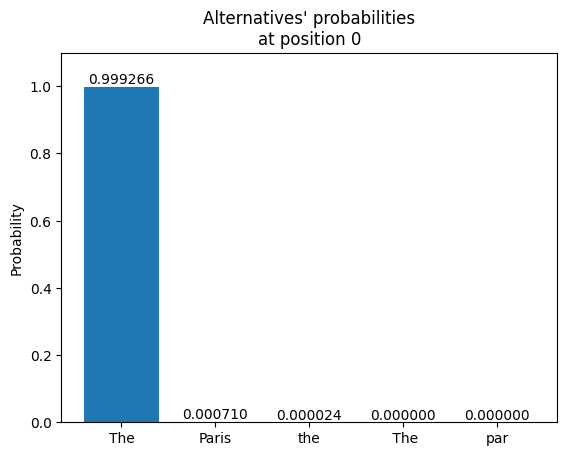

In [24]:
# Task 6b: Visualize Token Probabilities (5 pts)

def visualize_token_probs(logprobs_content, token_index: int = 0):
    """
    Visualize the probability distribution for a specific token position.
    
    Args:
        logprobs_content: The logprobs.content from the response
        token_index: Which token position to visualize (0 = first token)
    """
    # YOUR CODE HERE:
    # 1. Get the top_logprobs for the specified token_index
    # 2. Convert logprobs to probabilities
    # 3. Create a visualization (bar chart or ASCII art)
    cctlp_indexed = logprobs_content[token_index]
    alts, probs = [], []     # alts for alternatives, probs for probabilities
    for item in cctlp_indexed.top_logprobs:
        # Converting logprob into probability in [0. 1] 
        prob = math.exp(item.logprob)
        alts.append(item.token)
        probs.append(prob)
    # Forming bar chart, including labels
    fig, ax = plt.subplots()
    bar_container = ax.bar(alts, probs)
    ax.set(ylabel = "Probability",
           title = f"Alternatives' probabilities\nat position {token_index}",
           ylim = (0, 1.1))
    ax.bar_label(bar_container, fmt = "{:,.6f}")
    
    return print(f"Position {token_index} visualized:")
    # pass

# Test your visualization on the first token
visualize_token_probs(response_6a.choices[0].logprobs.content, token_index=0)

Position 5 visualized:


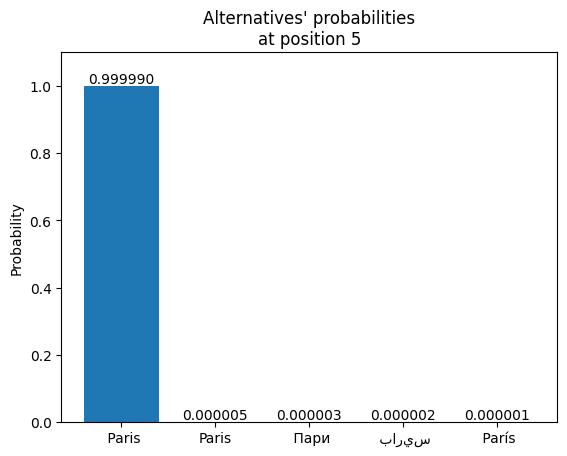

In [25]:
# Adding another just for fun, to see how plt handles the non-Latin scripts
visualize_token_probs(response_6a.choices[0].logprobs.content, 5)

_The question posed in this LLM prompt had a pretty unambiguous answer. Conceivably, though, a user might complicate the situation by asking about [South Africa](https://en.wikipedia.org/wiki/South_Africa), a country with three capitals, in which case such a probabilty distribution might be more "competitive"._

---

## Task 7: Reasoning Models (15 points)

**Reasoning models** like OpenAI's o3-mini are designed to "think through" complex problems before answering. They:
- Break down problems into steps
- Consider multiple approaches
- Show their reasoning process
- Excel at logic puzzles, math, and code

### 7a. Using o3-mini for Complex Reasoning (10 pts)

Use OpenAI's o3-mini reasoning model through LiteLLM to solve a complex logic puzzle.

**Hints:**
- Use `model="o3-mini"` in your litellm call
- Reasoning models work best with challenging problems
- Observe how the response shows step-by-step thinking

In [26]:
# Task 7a: Using o3-mini for Complex Reasoning (10 pts)

# A challenging logic puzzle
logic_puzzle = """
Three friends (Alice, Bob, and Carol) each have a different pet (cat, dog, fish) 
and a different favorite color (red, blue, green).

Clues:
1. Alice doesn't have the cat.
2. The person with the dog likes blue.
3. Carol likes green.
4. Bob doesn't have the fish.

Who has which pet and what is their favorite color?
Solve this step by step.
"""

# YOUR CODE HERE:
# Use o3-mini to solve this logic puzzle
response_7a = litellm.completion(
     model="o3-mini",
     messages=[{"role": "user", "content": logic_puzzle}]
     )

# Print the response and observe the reasoning process
print(response_7a.choices[0].message.content)

Let's solve the puzzle step by step.

Step 1: List the options for each person.

Persons: Alice, Bob, Carol  
Pets: cat, dog, fish  
Colors: red, blue, green

Step 2: Write down the clues.

1. Alice doesn't have the cat.
2. The person with the dog likes blue.
3. Carol likes green.
4. Bob doesn't have the fish.

Step 3: Use the clues to start deducing.

• Clue 3 tells us Carol’s favorite color is green.
• Clue 2 tells us that whoever has the dog must have blue as their favorite color. Since Carol’s color is already green, Carol cannot have the dog.
• This leaves either Alice or Bob as the person who has the dog and blue.

Step 4: Examine the pet options based on additional clues.

• Clue 1 says Alice does not have the cat.
• Clue 4 says Bob does not have the fish.

Thus:
- Alice must have either the dog or the fish.
- Bob must have either the dog or the cat.
- Carol, who cannot have the dog (because her color is green, but dog comes with blue), must have either the cat or the fish.

Ste

### 7b. Compare Reasoning vs Non-Reasoning (5 pts)

Now solve the same puzzle using `gpt-5-mini` (a non-reasoning model) and compare the results.

**Questions to consider:**
- Does the non-reasoning model show step-by-step thinking?
- Which model gets the correct answer?
- How does the response structure differ?

In [27]:
# Task 7b: Compare Reasoning vs Non-Reasoning (5 pts)

# YOUR CODE HERE:
# 1. Send the same logic_puzzle to gpt-5-mini
# 2. Compare the response to o3-mini's response

response_standard = litellm.completion(
     model="gpt-5-mini",
     messages=[{"role": "user", "content": logic_puzzle}]
     )

# Print and compare:
# - Did both models get the correct answer?
# - How did their reasoning processes differ?
# - Which response was more helpful/clear?

print(response_standard.choices[0].message.content)

Step 1 — use the direct clues:
- Carol likes green (clue 3).
- The dog person likes blue (clue 2), so whoever has the dog must be the blue fan — therefore the dog owner is not Carol (Carol is green).
- Alice does not have the cat (clue 1).
- Bob does not have the fish (clue 4).

Step 2 — deduce remaining possibilities:
- The dog must be either Alice or Bob (not Carol).
- Alice cannot have the cat, so Alice’s pet is either dog or fish.
- Bob cannot have the fish, so Bob’s pet is either dog or cat.

There are two consistent assignments:

Option 1
- Alice = dog, color blue (dog person is blue).
- Bob = cat, color red (remaining color).
- Carol = fish, color green.

Option 2
- Alice = fish, color red.
- Bob = dog, color blue.
- Carol = cat, color green.

Both options satisfy all four clues. Therefore the puzzle as stated is ambiguous — an additional clue is needed to pick one unique solution (for example, “Alice likes red” would force Option 2, or “Bob likes blue” would force Option 1).


In [47]:
# Organizing models' answers for more legible comparison
    # Ref. https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.from_dict.html
task7_dict = {
    "index" : [("o3-mini", "(1)"),
        ("GPT-5 mini", 1), ("GPT-5 mini", 2)],
    "columns" : [("Alice", "pet"), ("Alice", "color"),
        ("Bob", "pet"), ("Bob", "color"),
        ("Carol", "pet"), ("Carol", "color")],
    "data" : [["fish", "red", "dog", "blue", "cat", "green"],
        ["dog", "blue", "cat", "red", "fish", "green"],
        ["fish", "red", "dog", "blue", "cat", "green"]],
    "index_names" : ["MODEL", "OPTION"],
    "column_names" : ["FRIEND", "HAS"],
    }

task7_df = pd.DataFrame.from_dict(task7_dict, orient = "tight")
display(task7_df)

FRIEND            Alice        Bob       Carol       
HAS                 pet color  pet color   pet  color
MODEL      OPTION                                    
o3-mini    (1)     fish   red  dog  blue   cat  green
GPT-5 mini 1        dog  blue  cat   red  fish  green
           2       fish   red  dog  blue   cat  green

In [ ]:
# print(logic_puzzle)


Three friends (Alice, Bob, and Carol) each have a different pet (cat, dog, fish) 
and a different favorite color (red, blue, green).

Clues:
1. Alice doesn't have the cat.
2. The person with the dog likes blue.
3. Carol likes green.
4. Bob doesn't have the fish.

Who has which pet and what is their favorite color?
Solve this step by step.



_COMPARISON_
* Did both models get the correct answer?<br> _>> A tricky question! It appears there are two valid solutions, o3-mini seems to recognize that as of its Step 4, but ultimately only delivers a single "Final Answer" (consistent with GPT-5 mini's "Option 2," as shown in the DataFrame) after assuming Bob has a dog in its Step 5 and seemingly forgetting thereafter to check whether his having a cat could likewise satisfy the puzzle conditions._
* How did their reasoning processes differ?<br> _>> o3-mini is more faithful to the instruction to go step-by-step and is more verbose, while GPT-5 is dry and succinct once it arrives at its conclusions. (In a previous run, GPT-5 mini used more mathematical symbols and phraseology, e.g. "case analysis," "given," "by," "satisfied," "Therefore")._
* Which response was more helpful/clear?<br> _>> I assess that GPT-5 mini is objectively more helpful because it is more comprehensive, but o3-mini feels somewhat clearer with its patient tone of explication. To my intuition, GPT-5 mini reads like a textbook, while o3-mini sounds like a teacher delivering a classroom lecture._

---

## Task 8: Generate Movie Poster (20 points)

Now for the fun part - generating movie posters using AI!

### 8a. Design a prompt generator (5 pts)

Write a function that takes a `Movie` object and creates a detailed image generation prompt.

**Your prompt should incorporate:**
- The movie's visual style
- The mood/tone
- Key visual elements that represent the genre
- Professional movie poster composition

**Tip:** Aim for 50-100 words. Be specific about colors, composition, and style!

_I'm aware I could ping an LLM for all this, but being rather inexperienced overall with prompt engineering, I see fit to try my hand at formulation and work more with the_ `Movie` _object._

In [30]:
# Task 8a: Design your prompt generator (5 pts)

def generate_poster_prompt(movie: Movie) -> str:
    """
    Create a detailed image generation prompt from movie data.
    
    Returns a detailed prompt string (aim for 50-100 words)
    """
    # YOUR CODE HERE - design your prompt template
    # Consider: How can you use the movie's mood, visual_style, and genre
    # to create an evocative image prompt?
    
    prompt = f"""
    Generate cinema-format poster, graphics from {movie.year} time period,
    movie in {movie.genre} genre, aesthetic like {movie.visual_style}.
    Show all characters listed in {movie.main_characters} interacting, reflecting {movie.mood}.
    Display title \"{movie.title}\" in large letters across center of poster.
    If tagline provided, display \"{movie.tagline}\" as smaller-font text near top of poster.
    """

    return prompt
    # pass

In [31]:
# Test your prompt generator
chosen_movie = movies[0]  # or pick your favorite from the list!
prompt = generate_poster_prompt(chosen_movie)

print(f"Prompt for '{chosen_movie.title}':")
print()
print(prompt)

Prompt for 'Jurassic Park':


    Generate cinema-format poster, graphics from 1993 time period,
    movie in sci-fi genre, aesthetic like spectacular, suspenseful, awe-inspiring realism with groundbreaking CGI dinosaurs.
    Show all characters listed in ['Dr. Alan Grant', 'Dr. Ellie Sattler', 'Dr. Ian Malcolm', 'John Hammond', 'Tim Murphy (Tim)\xa0Murphy)'] interacting, reflecting sense of wonder and terror.
    Display title "Jurassic Park" in large letters across center of poster.
    If tagline provided, display "None" as smaller-font text near top of poster.
    


### 8b. Generate the actual image (10 pts)

Use Google's Gemini to generate the movie poster.

**Hints:**
- Use `genai.Client()` to create a client
- Use `client.models.generate_content()` with `model="gemini-2.5-flash-image"`
- The response will have an image in `response.candidates[0].content.parts`
- Save the image to a file

In [32]:
# load_dotenv()
print(f"Length of Gemini API key: {len(os.environ["GOOGLE_API_KEY"])}")

Length of Gemini API key: 39


In [33]:
# Task 8b: Generate the movie poster (10 pts)

# Create Google client
google_client = genai.Client(api_key = os.environ.get("GOOGLE_API_KEY"))

# YOUR CODE HERE:
# 1. Generate the image using gemini-2.5-flash-image
# 2. Extract the image from the response
# 3. Save it to temp/poster_{movie_title}.png
#    (Create the temp directory if it doesn't exist)

# Make sure to create temp directory
os.makedirs("temp", exist_ok=True)

# Generate and save your poster here:
# Generate an image using Nano Banana (Gemini's native image generation)
response_8b = google_client.models.generate_content(
    model="gemini-2.5-flash-image",  # Nano Banana model
    contents=[generate_poster_prompt(movies[0])],
    )

In [34]:
# Find and save the image from the response
output_path = f"temp/{str(movies[0].title).replace(" ", "_")}.png"

for part in response_8b.parts:
    if part.inline_data is not None:
        image = part.as_image()
        image.save(output_path)
        print(f"Image saved to {output_path}")
        break

Image saved to temp/Jurassic_Park.png


### 8c. Display the image (5 pts)

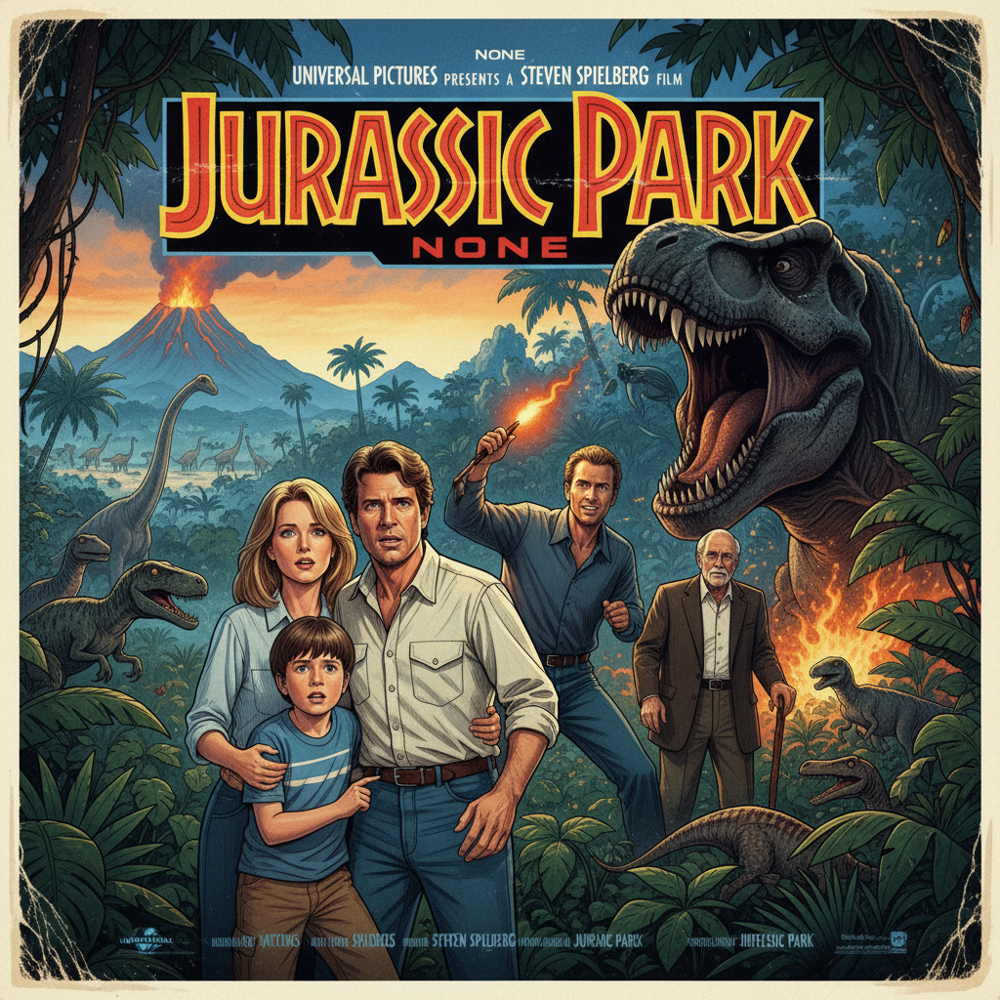

In [35]:
# Task 8c: Display the saved image (5 pts)
# from IPython.display import Image, display     # Import statements moved to top of Notebook

# YOUR CODE HERE - display the poster you saved
    # Ref. https://ipython.readthedocs.io/en/9.3.0/api/generated/IPython.display.html#IPython.display.Image
Image(output_path)

In [36]:
# Refreshing memory,
print(f"Description:\n{movie_descriptions[0]}\n\nPrompt:{generate_poster_prompt(chosen_movie)}")

Description:
A dinosaur theme park on a remote island goes terribly wrong when the security 
    systems fail during a tropical storm. Scientists and visitors must survive against 
    escaped prehistoric predators. Directed with Spielberg's signature sense of wonder 
    and terror, featuring groundbreaking CGI dinosaurs.

Prompt:
    Generate cinema-format poster, graphics from 1993 time period,
    movie in sci-fi genre, aesthetic like spectacular, suspenseful, awe-inspiring realism with groundbreaking CGI dinosaurs.
    Show all characters listed in ['Dr. Alan Grant', 'Dr. Ellie Sattler', 'Dr. Ian Malcolm', 'John Hammond', 'Tim Murphy (Tim)\xa0Murphy)'] interacting, reflecting sense of wonder and terror.
    Display title "Jurassic Park" in large letters across center of poster.
    If tagline provided, display "None" as smaller-font text near top of poster.
    


_ABRIDGED OBSERVATIONS_
* `gpt-5-mini` _did not end up returning lexical content for optional schema-component_ `Movie.tagline` _in Task 4b, so_ `prompt` _passes the default_ `None` _to Nano Banana, hence the amusing "NONE" appearing above and below the title (placements that indeed qualifies as "near top of poster")._
* _I note the poster alludes to the Universal Studio brand... there may be intellectual property concerns._

---

## Task 9: Submit via Pull Request (15 points)

Now let's practice a real-world development workflow! Instead of pushing directly to `main`, you'll create a **branch**, open a **Pull Request (PR)**, and **merge** it.

This is how professional developers submit code for review. Your TA will check your merged PR to verify your submission.

### 9a. Create a new branch (5 pts)

Run this command in your terminal to create and switch to a new branch:

In [ ]:
# Task 9a: Create a new branch (5 pts)
# Run this in your terminal (not in this notebook!)

!git checkout -b homework-2

_I ended up needing to use_ `git checkout -B homework-2`_, with a capital B, after a previous premature checkout. The AI section of a Google search cited [gitlab documentation](https://gitlab.com/gitlab-org/gitlab/-/merge_requests/99218) for the fix._

### 9b. Commit your work (5 pts)

Stage all your changes and create a commit:

In [ ]:
# Task 9b: Commit your work (5 pts)

!git add .
!git commit -m "Complete homework 2: Movie Poster Generator"

In [ ]:
# Task 9c: Push your branch (5 pts)

!git push -u origin homework-2

### 9d. Create and Merge the Pull Request

Now go to your repository on GitHub (https://github.com/lchiangnyc/ai-engineering-fordham):

1. You should see a banner saying **"homework-2 had recent pushes"** - click **"Compare & pull request"**
2. Give your PR a title: `"Homework 2: Movie Poster Generator"`
3. Click **"Create pull request"**
4. Review your changes in the PR
5. Click **"Merge pull request"** then **"Confirm merge"**

**Your PR should now show as "Merged"** - this is what the TA will check!

Run the cell below to verify your branch was merged:

In [56]:
# Verify your PR was merged (run after merging on GitHub)
!git checkout main
!git pull
!git log --oneline -3

Your branch is up to date with 'origin/main'.


Switched to branch 'main'


Updating 692e383..22ddd2c
Fast-forward
 .gitignore                            |   23 +
 cursor-chat_hw-2.md                   |  607 +++++++++
 homework-2.ipynb                      | 2384 +++++++++++++++++++++++++++++++++
 main.py                               |    6 +
 pyproject.toml                        |   26 +
 temp/A_Christmas_Alien_Encounter.png  |  Bin 0 -> 1910351 bytes
 temp/Haven_Hill.png                   |  Bin 0 -> 1921516 bytes
 temp/Hospitality_for_the_Holidays.png |  Bin 0 -> 1828145 bytes
 temp/Jurassic_Park.png                |  Bin 0 -> 2137156 bytes
 temp/Worlds_Collide.png               |  Bin 0 -> 1838693 bytes
 uv.lock                               | 2219 ++++++++++++++++++++++++++++++
 11 files changed, 5265 insertions(+)
 create mode 100644 .gitignore
 create mode 100644 cursor-chat_hw-2.md
 create mode 100644 homework-2.ipynb
 create mode 100644 main.py
 create mode 100644 pyproject.toml
 create mode 100644 temp/A_Christmas_Alien_Encounter.png
 create mode 

From https://github.com/lchiangnyc/ai-engineering-fordham
   692e383..22ddd2c  main       -> origin/main


22ddd2c Merge pull request #1 from lchiangnyc/homework-2
7b93a2d Complete homework 2: Movie Poster Generator
692e383 Complete homework 1


---

## BONUS: Full Pipeline (10 bonus points)

Put everything together! Create a complete pipeline that takes a movie description and returns both the structured data AND a generated poster.

**Challenge:** Write your own original movie description and generate a poster for it!

In [53]:
# BONUS: Create a complete pipeline (10 bonus pts)

async def movie_to_poster(description: str) -> tuple[Movie, str]:
    """
    Complete pipeline: description -> structured data -> poster
    
    Args:
        description: A text description of a movie
        
    Returns:
        Tuple of (Movie object, path to saved poster image)
    """
    # YOUR CODE HERE
    
    # Making API keys available to program
    load_dotenv()

    # Calling OpenAI to impose schema onto description
        # Ref. https://docs.litellm.ai/docs/completion/input
    response_movieData = await litellm.acompletion(
        model = "gpt-4o-mini",
        messages = [
            {
                "role": "system",
                "content": "Extract structured information from movie description."
                },
            {
                "role": "user",
                "content": f"Extract information from this description:\n\n{description}"
                }
            ],
        temperature = 1.0,     # Selecting moderate temperature
        response_format = Movie
        )
    movieData = Movie.model_validate_json(response_movieData.choices[0].message.content)

    # Formulating image prompt from schematized description
    prompt = f"""Generate cinema-format poster, graphics from {movieData.year} time period,
    movie in {movieData.genre} genre, aesthetic like {movieData.visual_style}.
    Show all characters listed in {movieData.main_characters} interacting, reflecting {movieData.mood}.
    Display title \"{movieData.title}\" in large letters across center of poster.
    If tagline provided, display \"{movieData.tagline}\" as smaller-font text near top of poster.
    """

    # Preparing directory for file
    os.makedirs("temp", exist_ok=True)
    output_path = f"temp/{str(movieData.title).replace(" ", "_")}.png"

    # Calling Google to generate imag
    google_client = genai.Client(api_key = os.environ.get("GOOGLE_API_KEY"))
    response_NB = google_client.models.generate_content(     # NB for Nano Banana
        model = "gemini-2.5-flash-image",  # Nano Banana model
        contents = [prompt],
        )
    
    for part in response_NB.parts:
        if part.inline_data is not None:
            image = part.as_image()
            image.save(output_path)
            print(f"Image saved to {output_path}")
            break
    
    return (movieData, output_path)
    # pass

In [54]:
# Test with YOUR OWN original movie idea!

# YOUR ORIGINAL MOVIE IDEA HERE - BE CREATIVE!
# Describe the plot, characters, setting, visual style, and mood.

my_movie_description = """Worlds collide in near-future Buffalo:

Beleaguered bookseller Brandi begrudgingly hires her chronically underachieving cousin Clifford
as a seasonal temp in her struggling shop as a Christmastime favor to her aunt,
only for his clumsiness in handling a shipment to severely injure them both...
plus an unfortunate bystander Ayesha, an ace attorney now threatening to sue.

The unfortunate trio is hospitalized for the holidays at Haven Hill,
a highly automated healthcare facility overseen by AGI-level entity Hilda,
where a massive sudden-onset blizzard ensures no one will get in or out for days.

The three exchange hostile glares while poking at miserably mushy meals in the cyberclinic's cafeteria,
lights sterile and bright as ever overhead. That is, until software developer and gambling debtor Devon,
who infiltrated Haven Hill's server room earlier that week before being unexpectedly snowed in,
triggers a vicious ransomware attack, hoping desperately for a payoff after being laid off.

During the resulting shutdown, Hilda's agentic capability, scrambling to follow instructions
in the system prompt to call for help, manages in a last-ditch effort to take over a nearby radio tower
and beams a hallucinated broadcast that catches the attention
of an alien spaceship stealthily scouting our solar system for intelligent life.

ABCD catches wind of Hilda's broadcast over the PA system,
hearing also the distorted but insistently periodic reply from space, 
too rhythmic– as they all recognize from their shared fandom of science fiction– to be mere coincidence.

Now anticipating an imminent encounter whilst clad only in their gauze-thin gowns,
the cold quartet could be humanity's last hope or its first ambassadors.
Tense debate ensues, each drawing on books from their favorite authors to make their case in deliberations
whether to reprogram Hilda's platoons of robotic helpers (previously knocked out by the ransomware)
to stage desperate defense against enemy extraterrestrial ensigns,
or to hail alien allies as potential friends in the Universe.
"""

# Uncomment to run:
movie, poster_path = await movie_to_poster(my_movie_description)

Image saved to temp/Hospitality_for_the_Holidays.png


### _Haven Hill_ (2023)

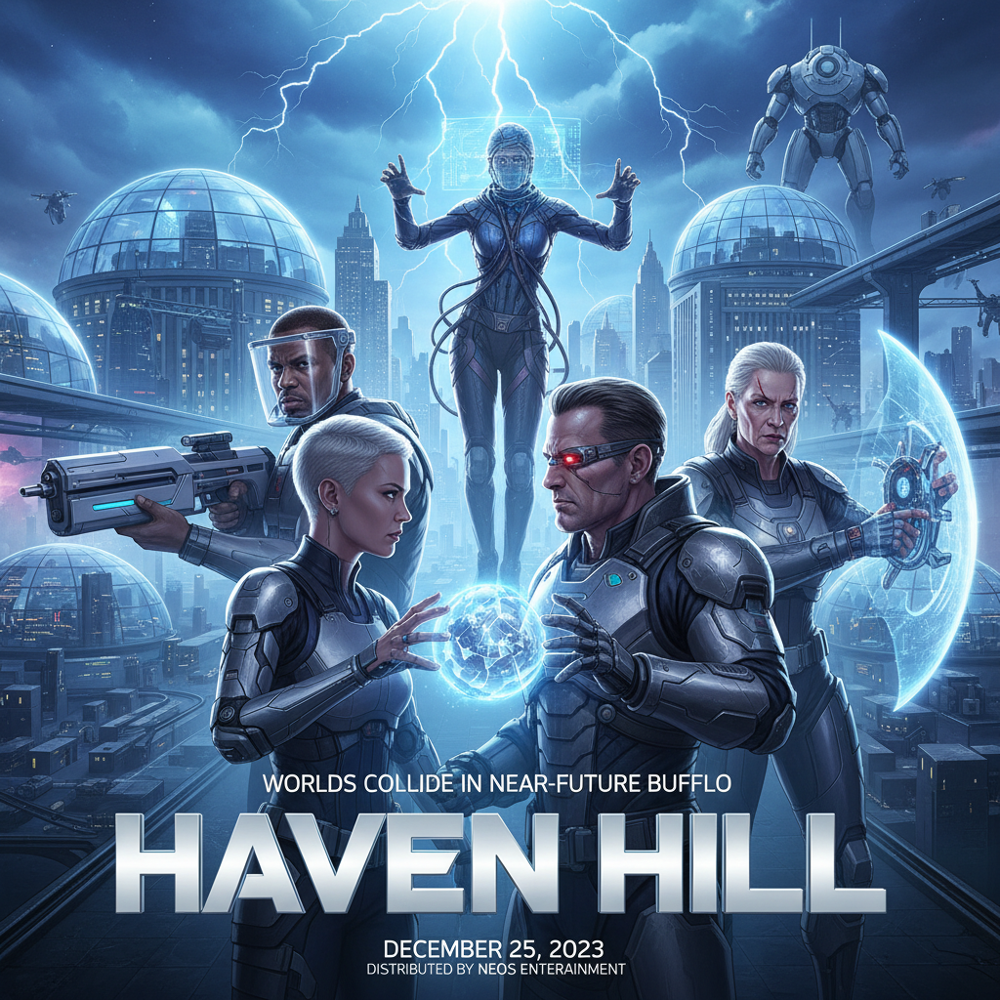

In [51]:
display(Image("temp/Haven_Hill.png"))

_ABRIDGED COMMENTARY_
* _I certainly hadn't imagined armored characters when thinking up the description! They're also outside, whereas I set the plot to take place indoors. I guess the face shield (on the character wielding the firearm) and the surgical mask (on the character hovering ominously) do reference the hospital, though._
* _In my imagination Hilda, was not physically embodied, being more like HAL 9000 or at most [Cortana of the <u>Halo</u> franchise](https://halo.fandom.com/wiki/Cortana). This spatial arrangement of the characters implies Hilda is the hovering figure, which accords with the spirit of my vision._
* _The title is appropriate, and my attempt to goad GPT into recognizing a tagline was successful here._
* _Regrettably I forgot to capture the tuple associated with this run, so I can't report the_ `mood`_or_ `visual_style` _associated with this image._

### _A Christmas Alien Encounter_ (2023)

Generated poster for: A Christmas Alien Encounter
{
  "title": "A Christmas Alien Encounter",
  "genre": "sci-fi",
  "year": 2023,
  "main_characters": [
    "Brandi",
    "Clifford",
    "Ayesha",
    "Devon",
    "Hilda"
  ],
  "mood": "tense and comedic",
  "visual_style": "bright and sterile",
  "tagline": "When Christmas meets the cosmos, anything can happen."
}


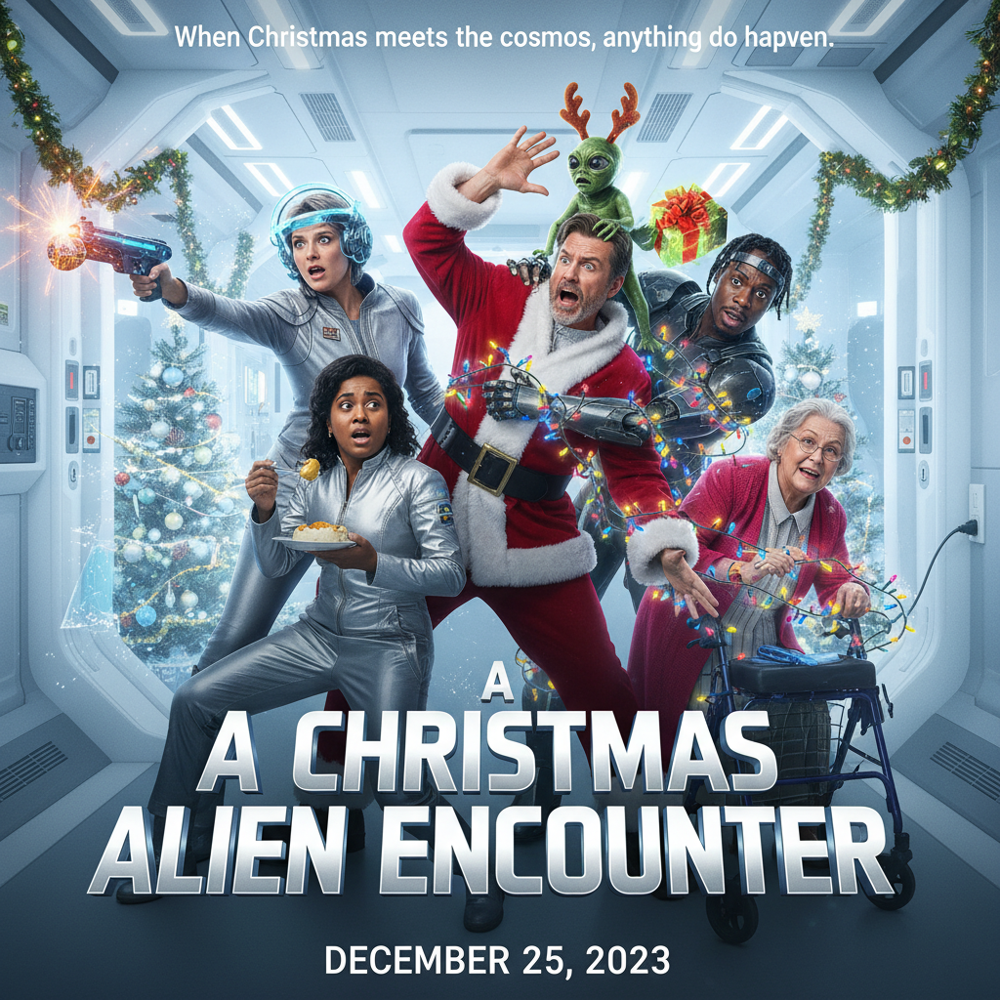

In [42]:
print(f"Generated poster for: {movie.title}")
print(movie.model_dump_json(indent=2))
display(Image(poster_path))

_ABRIDGED COMMENTARY_
* _2023 is no longer the near-future for us, but my function calls on_ `gpt-4o-mini`_, which has a [stated knowledge cutoff](https://platform.openai.com/docs/models/compare) of October 01, 2023._
* _The above poster certainly feels energetic; I did envision comedic beats for the opening act of the movie, and that shows here in the chaotic set of expressions on the character's faces. Apparently the aliens have already sent an envoy._
* _Cafeteria food made the cut!_
* _The hallway in the background seems to have taken design cues from <u>2001: A Space Odyssey</u> or perhaps <u>Star Wars</u> (in particular the_ [Tantive IV](https://www.starwars.com/video/stormtroopers-board-tantive-iv)_). My vision of Haven Hill doesn't have so many decorations._
* _There are spelling and grammatical errors in rendering the tagline ("do hapven [sic]") and title ("A[\n]A")._

_Another poster from a previous run is shown below (with filename_ `Avatar.png` _due to a programming oversight when defining_ `movie_to_poster`_):_

### _Worlds Collide_ (2023)

### _Worlds Collide_ (2023)

Generated poster for: Worlds Collide
{
  "title": "Worlds Collide",
  "genre": "sci-fi",
  "year": 2023,
  "main_characters": [
    "Brandi",
    "Clifford",
    "Ayesha",
    "Devon",
    "Hilda"
  ],
  "mood": "tense",
  "visual_style": "highly automated, sterile, bright",
  "tagline": "Clad only in gauze-thin gowns, four misfits could be humanity's last hope."
}


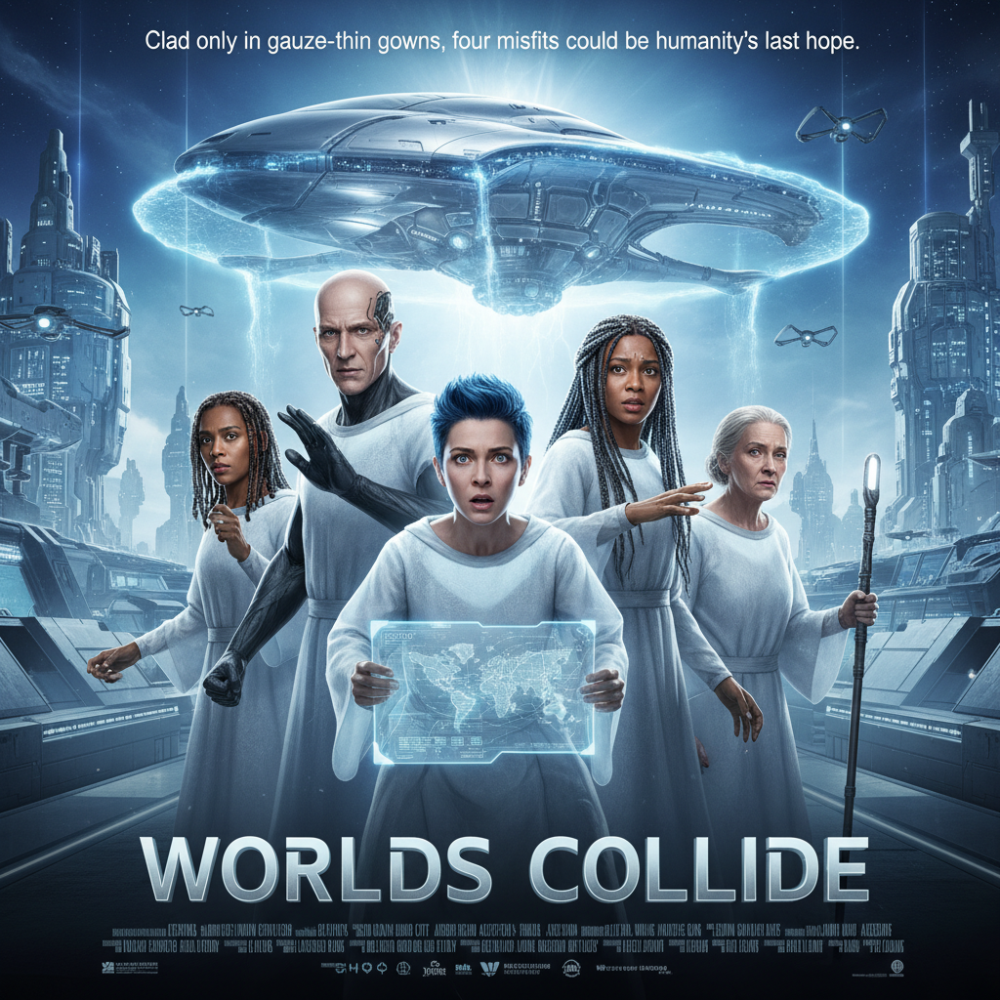

In [50]:
print(f"Generated poster for: {movie.title}")
print(movie.model_dump_json(indent=2))
display(Image(poster_path))

_COMMENTARY_
* _Finally, the characters are wearing hospital gowns. I rate the expressions as befitting_ `"mood": "tense"`_._
* _The alien's spacecraft makes an appearance._
* _No reference here to the release day._

### _Hospitality for the Holidays_ (2023)

Generated poster for: Hospitality for the Holidays
{
  "title": "Hospitality for the Holidays",
  "genre": "sci-fi",
  "year": 2023,
  "main_characters": [
    "Brandi",
    "Clifford",
    "Ayesha",
    "Devon",
    "Hilda"
  ],
  "mood": "tense",
  "visual_style": "bright and sterile",
  "tagline": "Worlds collide in near-future Buffalo."
}


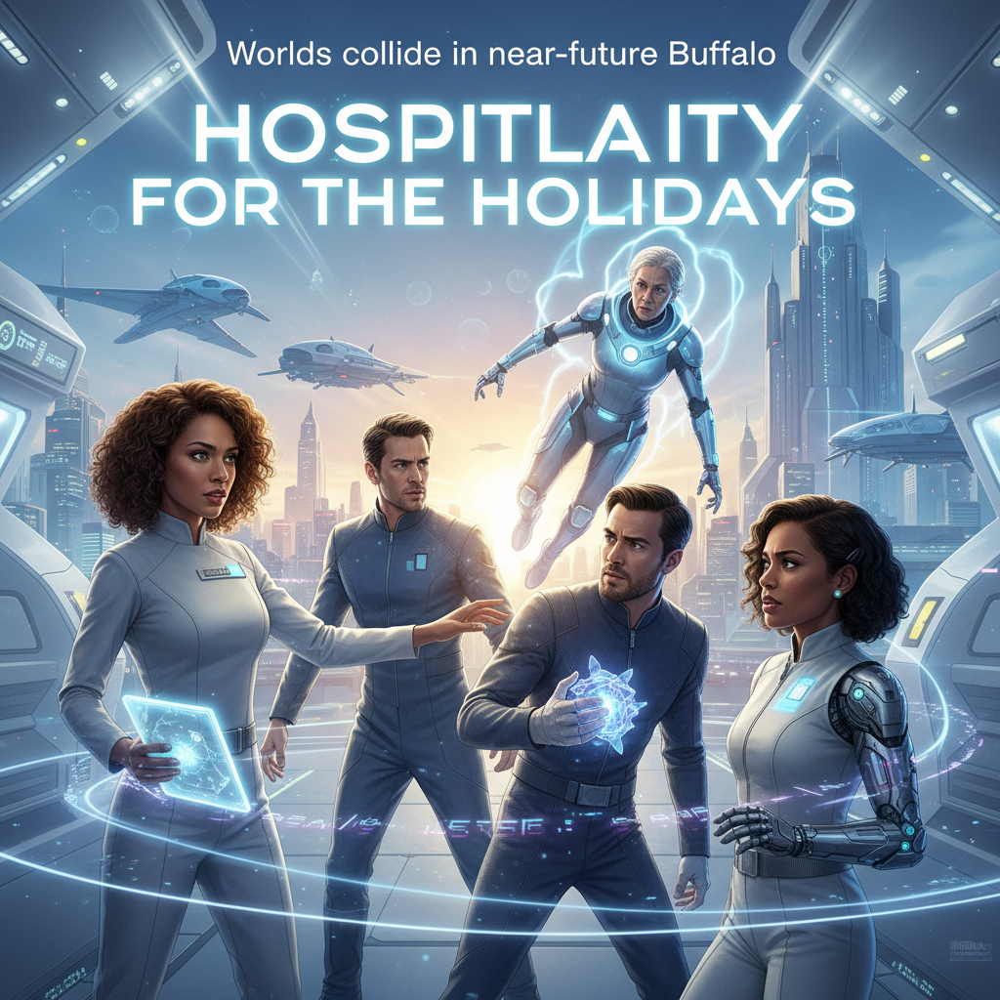

In [55]:
print(f"Generated poster for: {movie.title}")
print(movie.model_dump_json(indent=2))
display(Image(poster_path))

_COMMENTARY_
* _The four charcters in the foreground, a possibility I had not considered when writing the description._

---

## Submission Checklist

Before submitting, make sure:

- [ ] All code cells run without errors
- [ ] Your `Movie` schema includes all required fields with proper validation
- [ ] `extract_movie()` returns a valid `Movie` object
- [ ] Async processing works and shows timing
- [ ] Temperature comparison shows deterministic vs random outputs
- [ ] Logprobs visualization works and displays token probabilities
- [ ] Reasoning model comparison shows differences between o3-mini and gpt-5-mini
- [ ] You generated and displayed at least one movie poster
- [ ] Created branch `homework-2` and pushed to GitHub
- [ ] Opened a Pull Request from `homework-2` to `main`
- [ ] **Merged the PR** (it should show as "Merged" on GitHub)
- [ ] Submitted notebook on Blackboard

**Submission:**
1. Complete all tasks in this notebook
2. Create a PR and **merge it** on GitHub
3. Submit your notebook (`.ipynb` file) on **Blackboard**

**The TA will verify your submission by checking the merged PR on your GitHub repo.**

---

**Great work!** You've built a complete AI-powered application, explored LLM parameters and reasoning, and learned a professional Git workflow!